In [1]:
import pandas as pd
from matplotlib import pyplot as plt

# Intro

La visualización de datos es el proceso de proveer una representacion visual de datos. En esta clase revisaremos algunas de las bibliotecas mas comunes para este proposito dentro del ecosistema de python y al final de la misma tendremos herramientas para comunicar datos de una manera efectiva.

## Bibliotecas
- Módulo de plotting de pandas
- Pyplot
- Seaborn
- Pandas profiling

# Descargamos la data
Vamos a utilizar los datos de la [encuesta de sueldos 2020.02](https://sysarmy.com/blog/posts/resultados-de-la-encuesta-de-sueldos-2020-2/) de [sysarmy](https://sysarmy.com/es/).

In [2]:
GSPREADHSEET_DOWNLOAD_URL = (
    "https://docs.google.com/spreadsheets/d/{gid}/export?format=csv&id={gid}".format
)

SYSARMY_2020_2_GID = '1FxzaPoS0AkN8E_-aeobpr7FHAAy8U7vWcGE7PY4kJmQ'

In [3]:
df = pd.read_csv(GSPREADHSEET_DOWNLOAD_URL(gid=SYSARMY_2020_2_GID), skiprows=9)

## Una pequeña preview

In [4]:
pd.options.display.max_columns = None
df.head()

,Me identifico,Tengo,Estoy trabajando en,Dónde estás trabajando,Años de experiencia,Años en la empresa actual,Años en el puesto actual,¿Gente a cargo?,Nivel de estudios alcanzado,Estado,Carrera,Universidad,Realizaste cursos de especialización,¿Contribuís a proyectos open source?,¿Programás como hobbie?,Trabajo de,Plataformas,Lenguajes de programación,"Frameworks, herramientas y librerías",Bases de datos,QA / Testing,IDEs,¿Qué SO usás en tu laptop/PC para trabajar?,¿Y en tu celular?,¿Tenés guardias?,Cuánto cobrás por guardia,"¿Porcentaje, bruto o neto?",Tipo de contrato,Salario mensual BRUTO (en tu moneda local),Salario mensual NETO (en tu moneda local),Unnamed: 30,¿Qué tan conforme estás con tu sueldo?,Cómo creés que está tu sueldo con respecto al último semestre,Recibís algún tipo de bono,A qué está atado el bono,¿Tuviste ajustes por inflación en lo que va de 2020?,¿De qué % fue el ajuste total?,¿En qué mes fue el último ajuste?,¿Sufriste o presenciaste situaciones de violencia laboral?,Orientación sexual,¿Tenés algún tipo de discapacidad?,¿Sentís que esto te dificultó el conseguir trabajo?,Cantidad de empleados,Actividad principal,¿La recomendás como un buen lugar para trabajar?,¿Cómo calificás las políticas de diversidad e inclusión?,Beneficios extra,"¿Cuáles considerás que son las mejores empresas de IT para trabajar en este momento, en tu ciudad?"
0,Mujer,26,Argentina,Ciudad Autónoma de Buenos Aires,3.0,3.0,3.0,0,Universitario,En curso,Ingeniería en Sistemas de Información,UTN - Universidad Tecnológica Nacional,"Sí, los pagó un empleador",No,Sí,Consultant,Ninguna,Ninguno,Ninguno,Ninguna,Ninguna,Ninguno,GNU/Linux,Android,No,0.0,Bruto,Full-Time,53000.0,43000.0,NaN,1,1,No,No recibo bono,No,0.0,0,En mi trabajo actual,Homosexual,NaN,NaN,501-1000,Servicios / Consultoría de Software / Digital,7,2,"Capacitaciones y/o cursos, Comidas pagas / sub...",NaN
1,Hombre,29,Argentina,Corrientes,5.0,2.0,2.0,4,Universitario,En curso,Ingeniería en Sistemas de Información,UTN - Universidad Tecnológica Nacional,"Sí, de forma particular, Sí, los pagó un emple...",No,Sí,Developer,"Docker, Google Cloud Platform/App Engine","HTML, Javascript, Python","Django, jQuery","Informix, MySQL, PostgreSQL",Ninguna,"IPython / Jupyter, Sublime Text, Visual Studio...",GNU/Linux,Android,No,0.0,Bruto,Full-Time,79000.0,63000.0,NaN,2,2,Menos de un sueldo,Performance de la compañía,Uno,10.0,1,Jamás,Heterosexual,Visual,No,201-500,Otras industrias,8,9,"Horarios flexibles, Stock options / RSUs, Viát...",NaN
2,Mujer,22,Argentina,Ciudad Autónoma de Buenos Aires,2.0,0.0,0.0,0,Secundario,Completado,NaN,NaN,"Sí, de forma particular, Sí, los pagó un emple...",No,Sí,Infosec,"Linux, VMWare",Ninguno,Ninguno,Ninguna,Ninguna,Ninguno,Windows,iOS,No,0.0,Porcentaje de mi sueldo,Full-Time,160000.0,127000.0,NaN,3,3,Un sueldo,Performance individual,No,0.0,0,En un trabajo anterior,Bisexual o queer,NaN,No,2001-5000,Otras industrias,6,9,"Clases de gimnasia online, Comidas pagas / sub...",NaN
3,Hombre,39,Argentina,Corrientes,15.0,15.0,13.0,5,Posgrado,Incompleto,Licenciatura en Sistemas,UNNE Universidad Nacional del Nordeste,"Sí, de forma particular, Sí, los pagó un emple...",Sí,Sí,SysAdmin / DevOps / SRE,"Docker, Linux, OpenStack, VMWare, Windows Server","Bash/Shell, C, CSS, HTML, Java, Javascript, PH...","jQuery, WordPress","Microsoft SQL Server, MySQL",PHPUnit,"Eclipse, Visual Studio Code",GNU/Linux,Android,"Sí, pasiva",0.0,Bruto,Full-Time,130000.0,102000.0,NaN,3,1,No,No recibo bono,No,0.0,0,En mi trabajo actual,Heterosexual,NaN,NaN,501-1000,Otras industrias,7,6,"Abono de celular, Capacitaciones y/o cursos, C...",NaN
4,Hombre,32,Argentina,Ciudad Autónoma de Buenos Aires,9.0,6.0,6.0,0,Universitario,En curso,Licenciatura en Ciencias dela Computación,UBA - Universidad de Buenos Aires,No,No,Sí,Developer,Amazon Web Services,"CSS, HTML, Javascript, SQL, TypeScript","Angular, Node.js","Amazon DynamoDB, MongoDB, MySQL",Jest,Vim,macOS,Android,No,0.0,Porcentaje de mi sueldo,Full-Time,140000.0,1060

# Pandas plotting



Pandas incorpora algunas facilidades para [visualizaciones](https://pandas.pydata.org/pandas-docs/stable/user_guide/visualization.html) que son _wrappers_ alrededor de matplotlib. Se pueden utilizar [otros backends](https://pandas.pydata.org/pandas-docs/stable/user_guide/visualization.html#plotting-backends) desde la versión 0.25.

Veremos algunos plots sencillos aquí.

## Pie chart

Tenemos una variable binaria en la encuesta de sueldos que indica si la persona que respondió contribuye a proyectos open source. La respuesta es por `sí` o por `no`. Queremos ver como se distribuyen las respuestas. Para esto, hagamos un [pie chart](https://pandas.pydata.org/pandas-docs/stable/user_guide/visualization.html#pie-plot).

<AxesSubplot:ylabel='¿Contribuís a proyectos open source?'>

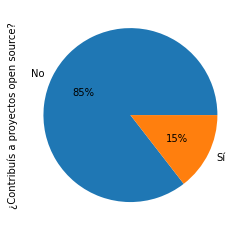

In [5]:
df['¿Contribuís a proyectos open source?'].value_counts().plot(
    kind='pie', autopct='%1.0f%%'
)

## Barplot

Ahora, consideremos la elección de sistemas operativos:

In [6]:
df['¿Qué SO usás en tu laptop/PC para trabajar?'].value_counts().sort_values(
    ascending=False
)

Windows      3442
GNU/Linux    1356
macOS        1292
*BSD            5
Name: ¿Qué SO usás en tu laptop/PC para trabajar?, dtype: int64

Con un pie plot, quedaría demasiado... complicado de interpretar:

<AxesSubplot:ylabel='¿Qué SO usás en tu laptop/PC para trabajar?'>

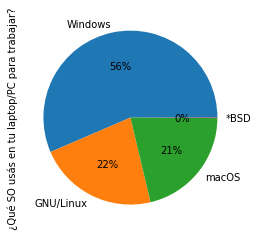

In [7]:
df['¿Qué SO usás en tu laptop/PC para trabajar?'].value_counts().plot(
    kind='pie', autopct='%1.0f%%'
)

BSD es una elección poco común, queda totalmente perdida. Por otro lado, sin las anotaciones de los porcentajes, sería muy dificil saber la diferencia entre `macOS` y `GNU/Linux`. `Windows` es más de la mitad, pero... ¿Cuánto mas?

Por esto, es mejor un [bar plot](https://pandas.pydata.org/pandas-docs/stable/user_guide/visualization.html#bar-plots):

<AxesSubplot:>

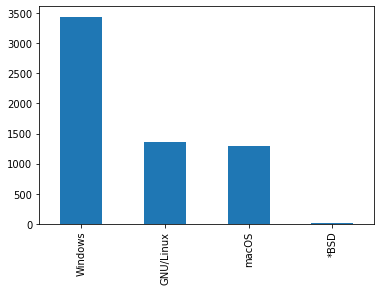

In [8]:
df['¿Qué SO usás en tu laptop/PC para trabajar?'].value_counts().sort_values(
    ascending=False
).plot(kind='bar')

## Scatter plot

Ahora tenemos la duda, ¿Cómo se relaciona el salario bruto con el salario neto? Tenemos puntos en dos dimensiones y queremos entender como se relacionan. Para ello, un [scatter plot](https://pandas.pydata.org/pandas-docs/stable/user_guide/visualization.html#scatter-plot) es adecuado:

<AxesSubplot:xlabel='Salario mensual NETO (en tu moneda local)', ylabel='Salario mensual BRUTO (en tu moneda local)'>

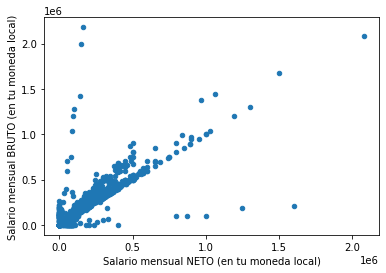

In [9]:
df.plot(
    x='Salario mensual NETO (en tu moneda local)',
    y='Salario mensual BRUTO (en tu moneda local)',
    kind='scatter',
)

Tenemos un montón de puntos apelotonados en la diagonal, veamos de reducir el diámetro de cada punto:

<AxesSubplot:xlabel='Salario mensual NETO (en tu moneda local)', ylabel='Salario mensual BRUTO (en tu moneda local)'>

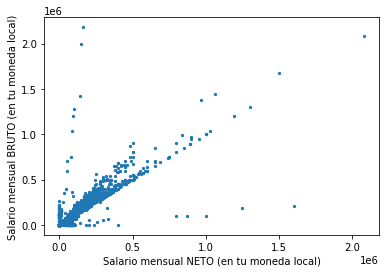

In [10]:
df.plot(
    x='Salario mensual NETO (en tu moneda local)',
    y='Salario mensual BRUTO (en tu moneda local)',
    kind='scatter',
    s=5,
)

## Histograma

Ahora, la encuesta considera también los ajustes salariales. Ese porcentaje varía por empresa. ¿hay muchos valores únicos?

In [11]:
df['¿De qué % fue el ajuste total?'].nunique()

127

Sí, montones. Podemos hacer un bar plot?

In [12]:
# df['¿De qué % fue el ajuste total?'].plot(kind='bar')

Podemos _intentarlo_ pero tarda una barbaridad en renderizarse.

Entonces, tenemos un soporte continuo, demasiados valores únicos. Seamos inteligentes y hagamos un [histograma](https://pandas.pydata.org/pandas-docs/stable/user_guide/visualization.html#histograms).

<AxesSubplot:ylabel='Frequency'>

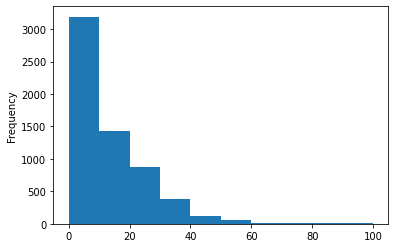

In [13]:
df['¿De qué % fue el ajuste total?'].plot(kind='hist')

Cambiando la cantidad de `bins` tenemos mayor granularidad:

<AxesSubplot:ylabel='Frequency'>

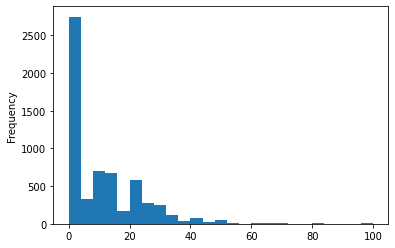

In [14]:
df['¿De qué % fue el ajuste total?'].plot(kind='hist', bins=25)

<AxesSubplot:ylabel='Frequency'>

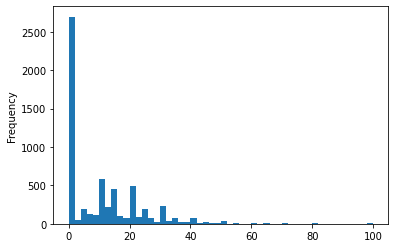

In [15]:
df['¿De qué % fue el ajuste total?'].plot(kind='hist', bins=50)

## Box plots

Siguiendo la línea de los salarios netos y brutos... ¿Cuánto es la media? ¿La mediana? Podemos tener un resumen estadístico con un [box plot](https://pandas.pydata.org/pandas-docs/stable/user_guide/visualization.html#box-plots)

<AxesSubplot:>

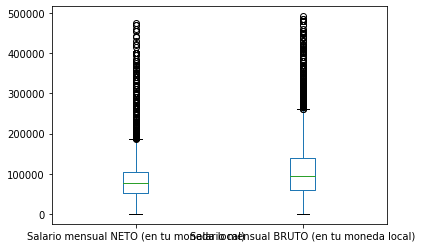

In [16]:
df[
    (df['Salario mensual NETO (en tu moneda local)'] < 500000)
    & (df['Salario mensual BRUTO (en tu moneda local)'] < 500000)
][
    [
        'Salario mensual NETO (en tu moneda local)',
        'Salario mensual BRUTO (en tu moneda local)',
    ]
].plot(
    kind='box'
)

Los labels quedan feos... como un hack, podemos renombrarlos:

<AxesSubplot:>

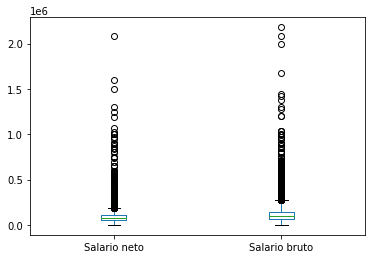

In [17]:
df[
    [
        'Salario mensual NETO (en tu moneda local)',
        'Salario mensual BRUTO (en tu moneda local)',
    ]
].rename(
    columns={
        'Salario mensual NETO (en tu moneda local)': 'Salario neto',
        'Salario mensual BRUTO (en tu moneda local)': 'Salario bruto',
    }
).plot(
    kind='box'
)

# Matplotlib

Dijimos que de fondo pandas usa [matplotlib](https://matplotlib.org) para hacer los plots. Es una librería que permite trabajar a bajo nivel, pero que también tiene un módulo de alto nivel llamado [pyplot](https://matplotlib.org/api/pyplot_api.html) que ofrece una interfaz similar a matlab, y es bastante cómoda. Muchas librerías de visualizaciones usan de fondo matplotlib.

Si revisamos los plots que hemos visto, nos gustaría poder cambiar algunas cosas:
- el tamaño
- la escala
- agregarle título
- descripción del eje y
- descripción del eje x
- etc

Revisaremos estos conceptos para trabajar más comodamente al momento de hacer plots

In [18]:
from matplotlib import pyplot as plt
import matplotlib

## Elementos de un plot
El siguiente código ha sido tomado de [la documentación de matplotlib](https://matplotlib.org/3.1.1/gallery/showcase/anatomy.html#anatomy-of-a-figure) para mostrar los diferentes elementos de un plot

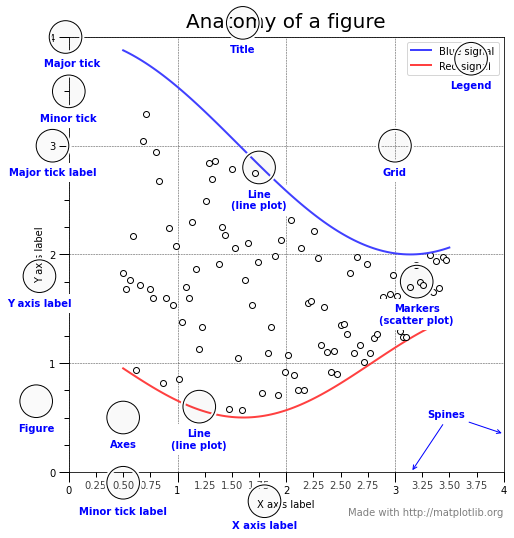

In [19]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.ticker import AutoMinorLocator, MultipleLocator, FuncFormatter

np.random.seed(19680801)

X = np.linspace(0.5, 3.5, 100)
Y1 = 3 + np.cos(X)
Y2 = 1 + np.cos(1 + X / 0.75) / 2
Y3 = np.random.uniform(Y1, Y2, len(X))

fig = plt.figure(figsize=(8, 8))
ax = fig.add_subplot(1, 1, 1, aspect=1)


def minor_tick(x, pos):
    if not x % 1.0:
        return ""
    return "%.2f" % x


ax.xaxis.set_major_locator(MultipleLocator(1.000))
ax.xaxis.set_minor_locator(AutoMinorLocator(4))
ax.yaxis.set_major_locator(MultipleLocator(1.000))
ax.yaxis.set_minor_locator(AutoMinorLocator(4))
ax.xaxis.set_minor_formatter(FuncFormatter(minor_tick))

ax.set_xlim(0, 4)
ax.set_ylim(0, 4)

ax.tick_params(which='major', width=1.0)
ax.tick_params(which='major', length=10)
ax.tick_params(which='minor', width=1.0, labelsize=10)
ax.tick_params(which='minor', length=5, labelsize=10, labelcolor='0.25')

ax.grid(linestyle="--", linewidth=0.5, color='.25', zorder=-10)

ax.plot(X, Y1, c=(0.25, 0.25, 1.00), lw=2, label="Blue signal", zorder=10)
ax.plot(X, Y2, c=(1.00, 0.25, 0.25), lw=2, label="Red signal")
ax.plot(X, Y3, linewidth=0, marker='o', markerfacecolor='w', markeredgecolor='k')

ax.set_title("Anatomy of a figure", fontsize=20, verticalalignment='bottom')
ax.set_xlabel("X axis label")
ax.set_ylabel("Y axis label")

ax.legend()


def circle(x, y, radius=0.15):
    from matplotlib.patches import Circle
    from matplotlib.patheffects import withStroke

    circle = Circle(
        (x, y),
        radius,
        clip_on=False,
        zorder=10,
        linewidth=1,
        edgecolor='black',
        facecolor=(0, 0, 0, 0.0125),
        path_effects=[withStroke(linewidth=5, foreground='w')],
    )
    ax.add_artist(circle)


def text(x, y, text):
    ax.text(
        x,
        y,
        text,
        backgroundcolor="white",
        ha='center',
        va='top',
        weight='bold',
        color='blue',
    )


# Minor tick
circle(0.50, -0.10)
text(0.50, -0.32, "Minor tick label")

# Major tick
circle(-0.03, 4.00)
text(0.03, 3.80, "Major tick")

# Minor tick
circle(0.00, 3.50)
text(0.00, 3.30, "Minor tick")

# Major tick label
circle(-0.15, 3.00)
text(-0.15, 2.80, "Major tick label")

# X Label
circle(1.80, -0.27)
text(1.80, -0.45, "X axis label")

# Y Label
circle(-0.27, 1.80)
text(-0.27, 1.6, "Y axis label")

# Title
circle(1.60, 4.13)
text(1.60, 3.93, "Title")

# Blue plot
circle(1.75, 2.80)
text(1.75, 2.60, "Line\n(line plot)")

# Red plot
circle(1.20, 0.60)
text(1.20, 0.40, "Line\n(line plot)")

# Scatter plot
circle(3.20, 1.75)
text(3.20, 1.55, "Markers\n(scatter plot)")

# Grid
circle(3.00, 3.00)
text(3.00, 2.80, "Grid")

# Legend
circle(3.70, 3.80)
text(3.70, 3.60, "Legend")

# Axes
circle(0.5, 0.5)
text(0.5, 0.3, "Axes")

# Figure
circle(-0.3, 0.65)
text(-0.3, 0.45, "Figure")

color = 'blue'
ax.annotate(
    'Spines',
    xy=(4.0, 0.35),
    xytext=(3.3, 0.5),
    weight='bold',
    color=color,
    arrowprops=dict(arrowstyle='->', connectionstyle="arc3", color=color),
)

ax.annotate(
    '',
    xy=(3.15, 0.0),
    xytext=(3.45, 0.45),
    weight='bold',
    color=color,
    arrowprops=dict(arrowstyle='->', connectionstyle="arc3", color=color),
)

ax.text(
    4.0, -0.4, "Made with http://matplotlib.org", fontsize=10, ha="right", color='.5'
)

plt.show()

### Figuras
En lo que nos es relevante ahora, una [figura](https://matplotlib.org/faq/usage_faq.html#figure) es un contenedor de plots. Las figuras tienen un identificador único. Podemos obtener la figura activa con `plt.gcf()` (`g`et `c`urrent `f`igure) o crear una nueva con `plt.figure()`.

Algunos parámetros que nos importan:
```
figsize(float, float), default: rcParams["figure.figsize"] (default: [6.4, 4.8])
Width, height in inches.

dpifloat, default: rcParams["figure.dpi"] (default: 100.0)
The resolution of the figure in dots-per-inch.
```

### Axis
Un [axis](https://matplotlib.org/faq/usage_faq.html#axes) es un plot per se, digamos.

### Axis labels
Son las descripciones en el eje x e y.

### Title
Es el título de la figura (no del plot).

### Legend
Son descripciones de colecciones de datos.

## Escalando los plots

Tenemos dos parámetros para ello. Hacen cosas distintas.

Por un lado `figsize` cambia el tamaño en pulgadas de la figura. `dpi` cambia la cantidad de pixels que hay en una pulgada.

Entonces dada una figura con figsize $(w,h)$ y dpi $d$: $$p_x = d*w\\p_y = d*h $$

Por defecto `dpi` vale `100` y `figsize` vale `[6.4, 4.8]`, de modo que obtendremos plots de `640 x 480`.

Podemos cambiar los valores por defecto de `matplotlib` a través del diciconario `rcParams`:

```python
matplotlib.rcParams['figure.dpi'] = 150
```

Veamos ahora algunos ejemplos.

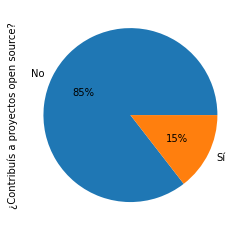

In [20]:
plt.figure()
df['¿Contribuís a proyectos open source?'].value_counts().plot(
    kind='pie', autopct='%1.0f%%'
)
plt.show()

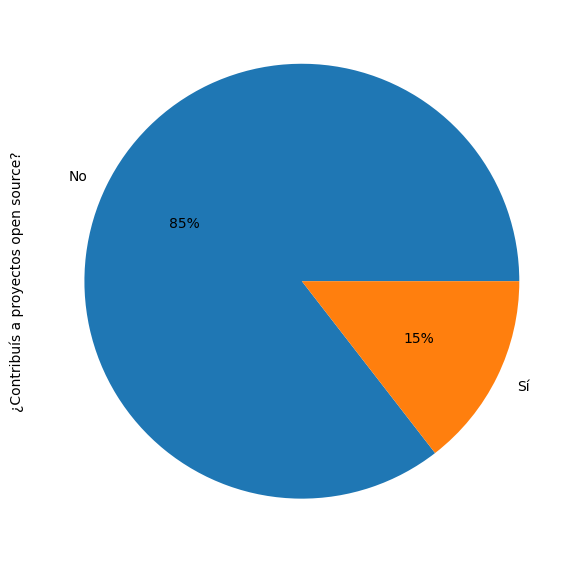

In [21]:
plt.figure(figsize=(6.4 * 1.5, 4.8 * 1.5), dpi=100)
df['¿Contribuís a proyectos open source?'].value_counts().sort_index().plot(
    kind='pie', autopct='%1.0f%%'
)
plt.show()

Las fuentes estan en terminos relativos al dpi

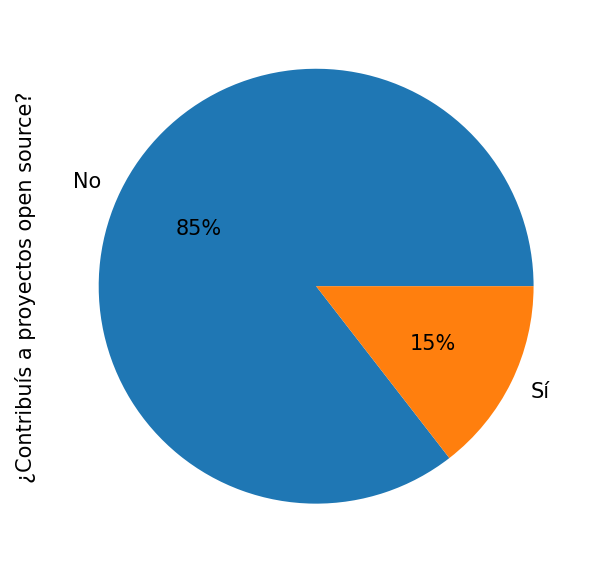

In [22]:
plt.figure(figsize=(6.4, 4.8), dpi=150)
df['¿Contribuís a proyectos open source?'].value_counts().sort_index().plot(
    kind='pie', autopct='%1.0f%%'
)
plt.show()

Recomendamos cambiar el tamaño con DPI si lo que se quiere es ver la visualizacion "mas grande", si lo que se quiere es cambiar la forma se puede usar el figsize

## Plots con pyplot

Vamos a repetir un poco los plots anteriores pero revisando la api de pyplot y cambiando algunas cosas.

### Bar plot

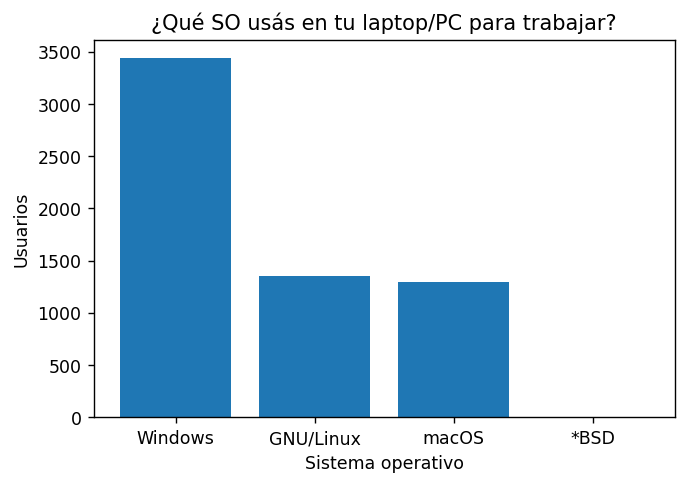

In [23]:
plt.figure(dpi=(125))
users_per_os = (
    df['¿Qué SO usás en tu laptop/PC para trabajar?']
    .value_counts()
    .sort_values(ascending=False)
)
plt.bar(users_per_os.index, users_per_os.values)
plt.ylabel("Usuarios")
plt.xlabel("Sistema operativo")
plt.title('¿Qué SO usás en tu laptop/PC para trabajar?')
plt.show()

Algo que podemos ver es que `*BSD` es un valor prácticamente invisible. ¿Mejora si se pone en escala y-logaritmica?

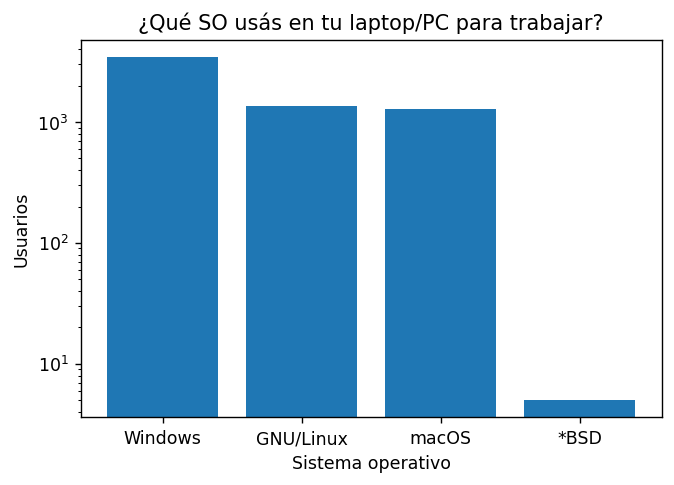

In [24]:
plt.figure(dpi=(125))
users_per_os = (
    df['¿Qué SO usás en tu laptop/PC para trabajar?']
    .value_counts()
    .sort_values(ascending=False)
)
plt.bar(users_per_os.index, users_per_os.values)
plt.yscale("log")
plt.ylabel("Usuarios")
plt.xlabel("Sistema operativo")
plt.title('¿Qué SO usás en tu laptop/PC para trabajar?')
plt.show()

No mucho, pero al menos se ve que está en el orden de $10^0$

Y que es ese `plt.show()` que estamos poniendo ahora? Básicamente muestra todas las figuras abiertas. En un notebook no hay mucha necesidad de usarlo, pero veremos el `__repr__` del último elemento de la celda si no lo hemos asignado a una variable (o si no le hemos puesto un `;` al final).

### Scatter plot

Revisemos un scatter plot, pero con la api de pyplot.

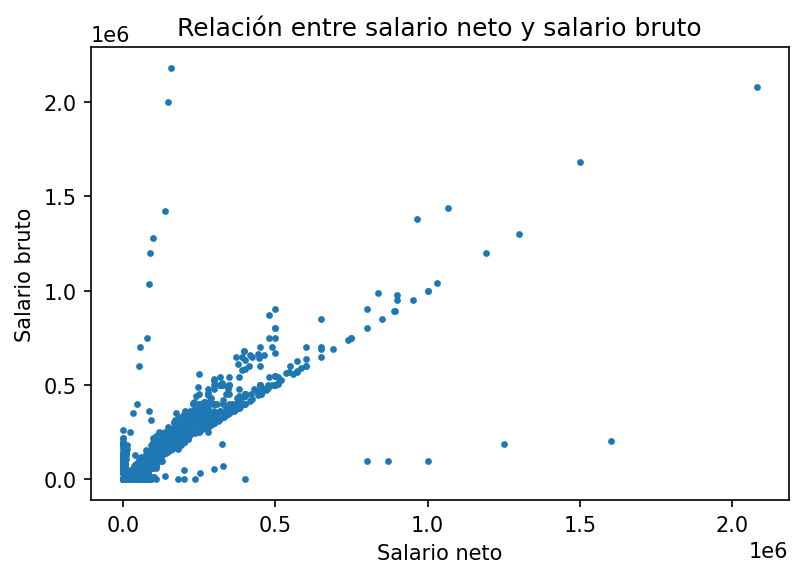

In [25]:
plt.figure(dpi=(150))
plt.scatter(
    x=df['Salario mensual NETO (en tu moneda local)'],
    y=df['Salario mensual BRUTO (en tu moneda local)'],
    s=5,
)
plt.ylabel("Salario bruto")
plt.xlabel("Salario neto")
plt.title('Relación entre salario neto y salario bruto')
plt.show()

¿Sería interesante ver que tan conforme está la gente con sus salarios no? Podemos introducir esa columna como color del scatter plot.

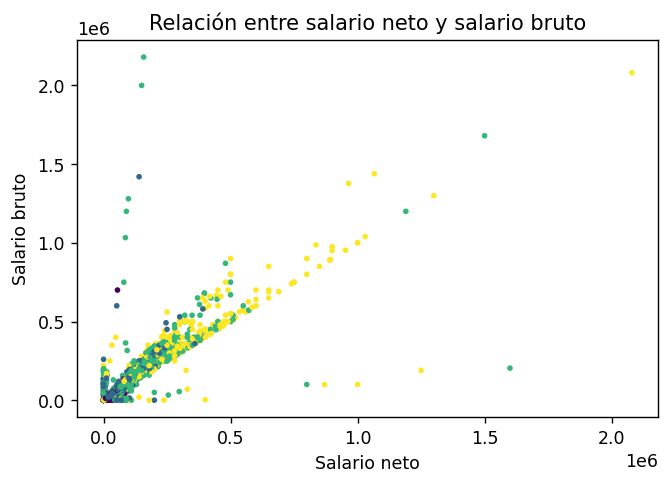

In [26]:
plt.figure(dpi=(125))

plt.scatter(
    x=df['Salario mensual NETO (en tu moneda local)'],
    y=df['Salario mensual BRUTO (en tu moneda local)'],
    s=5,
    c=df['¿Qué tan conforme estás con tu sueldo?'],
)
plt.ylabel("Salario bruto")
plt.xlabel("Salario neto")
plt.title('Relación entre salario neto y salario bruto')
plt.show()

No tenemos ni idea de que es cada color. Pongamos un [legend](https://matplotlib.org/api/_as_gen/matplotlib.pyplot.legend.html#matplotlib.pyplot.legend)!

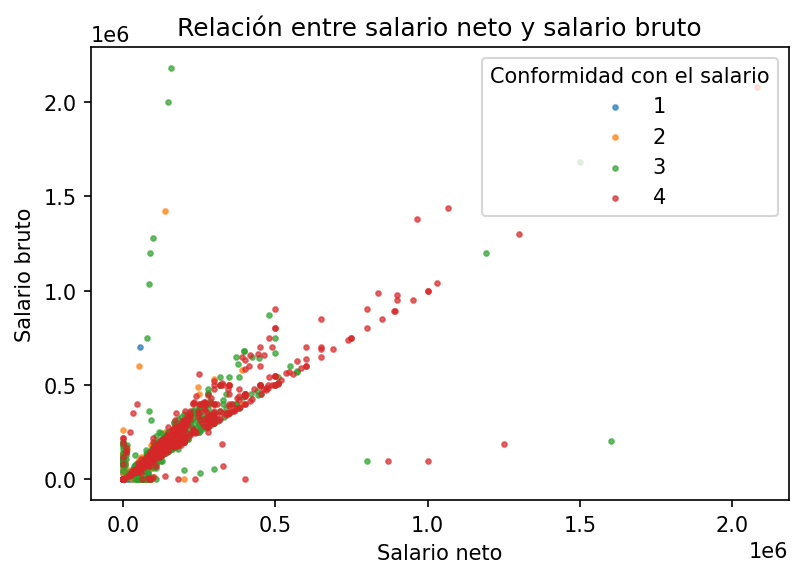

In [27]:
fig, ax = plt.subplots(dpi=150)

for conformity in np.sort(df['¿Qué tan conforme estás con tu sueldo?'].unique()):
    conformity_df = df[df['¿Qué tan conforme estás con tu sueldo?'] == conformity]
    ax.scatter(
        x=conformity_df['Salario mensual NETO (en tu moneda local)'],
        y=conformity_df['Salario mensual BRUTO (en tu moneda local)'],
        s=5,
        label=conformity,
        alpha=0.65,
    )

ax.legend(title="Conformidad con el salario")
plt.ylabel("Salario bruto")
plt.xlabel("Salario neto")
plt.title('Relación entre salario neto y salario bruto')
plt.show()

Pero hay outliers que nos complican... veamos los que están entre 10mil y 500mil

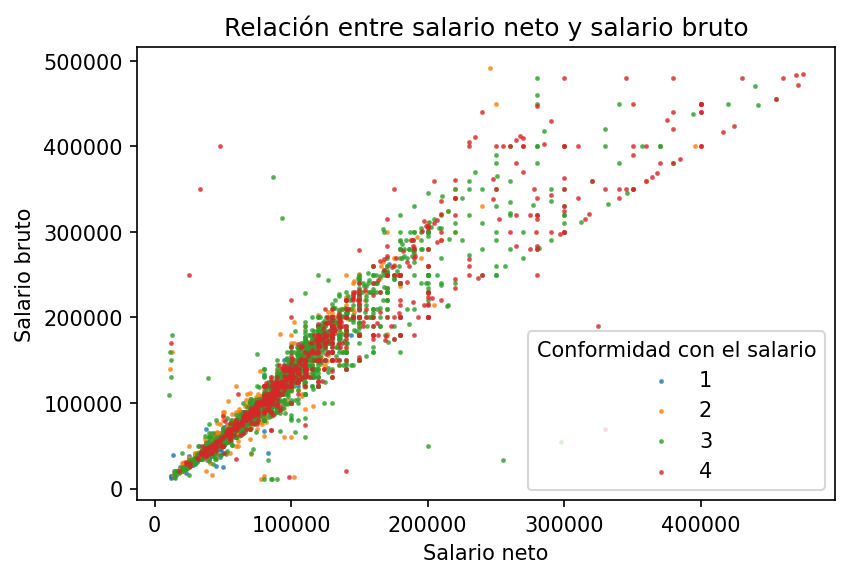

In [28]:
fig, ax = plt.subplots(dpi=150)

df_submm = df[
    (df['Salario mensual NETO (en tu moneda local)'] < 5e5)
    & (df['Salario mensual BRUTO (en tu moneda local)'] < 5e5)
    & (df['Salario mensual BRUTO (en tu moneda local)'] > 1e4)
    & (df['Salario mensual NETO (en tu moneda local)'] > 1e4)
]

for conformity in np.sort(df_submm['¿Qué tan conforme estás con tu sueldo?'].unique()):
    conformity_df = df_submm[
        df_submm['¿Qué tan conforme estás con tu sueldo?'] == conformity
    ]
    ax.scatter(
        x=conformity_df['Salario mensual NETO (en tu moneda local)'],
        y=conformity_df['Salario mensual BRUTO (en tu moneda local)'],
        s=2,
        label=conformity,
        alpha=0.65,
    )

ax.legend(title="Conformidad con el salario")
plt.ylabel("Salario bruto")
plt.xlabel("Salario neto")
plt.title('Relación entre salario neto y salario bruto')
plt.show()

Como la conformidad 4 fue la ultima en ser ploteada ofusca el plot, además los colores no parecen adecuados, ya solucionaremos esto

### Histograma

Quizás notaron ese llamado a `plt.subplots`. Vamos a ver un poco de qué se trata mientras vemos como hacer histogramas.

Tanto el salario neto como el salario bruto tienen soportes continuos, y demasiados valores diferentes. ¿Estaría bueno ver un histograma de cada uno no? Sería incluso mejor tenerlos lado a lado.

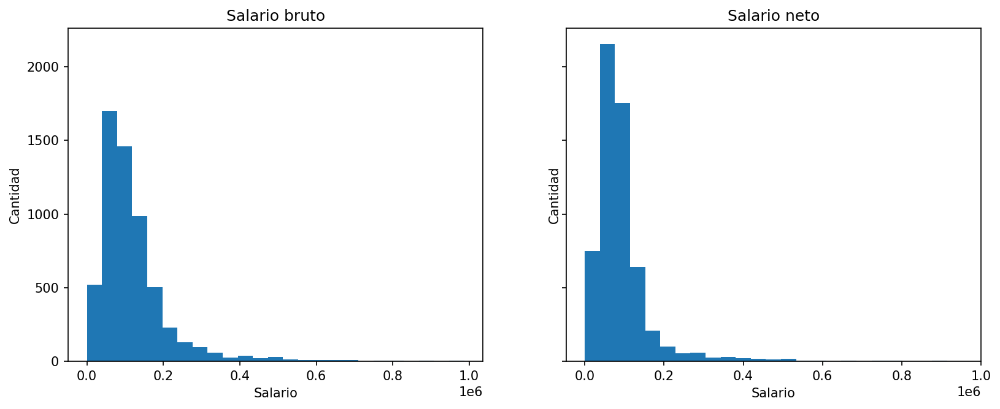

In [29]:
df_submm = df[
    (df['Salario mensual NETO (en tu moneda local)'] < 1e6)
    & (df['Salario mensual BRUTO (en tu moneda local)'] < 1e6)
]

fig, axes = plt.subplots(nrows=1, ncols=2, sharey=True, dpi=150, figsize=(6.4 * 2, 4.8))

axes[0].hist(df_submm['Salario mensual BRUTO (en tu moneda local)'], bins=25)
axes[0].set_title("Salario bruto")
axes[0].set_xlabel("Salario")
axes[0].set_ylabel("Cantidad")

axes[1].hist(df_submm['Salario mensual NETO (en tu moneda local)'], bins=25)
axes[1].set_title("Salario neto")
axes[1].set_xlabel("Salario")
axes[1].set_ylabel("Cantidad")

plt.show()

Sabiendo que podemos superponerlos, podriamos superponer los histogramas

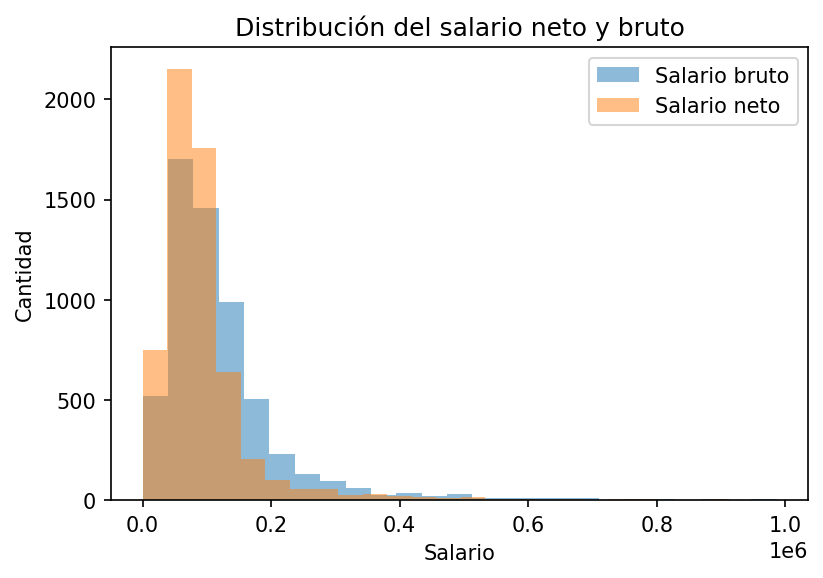

In [30]:
df_submm = df[
    (df['Salario mensual NETO (en tu moneda local)'] < 1e6)
    & (df['Salario mensual BRUTO (en tu moneda local)'] < 1e6)
]

plt.figure(dpi=150)

plt.hist(
    df_submm['Salario mensual BRUTO (en tu moneda local)'],
    bins=25,
    label="Salario bruto",
    alpha=0.5,
)
plt.hist(
    df_submm['Salario mensual NETO (en tu moneda local)'],
    bins=25,
    label="Salario neto",
    alpha=0.5,
)
plt.title("Distribución del salario neto y bruto")
plt.xlabel("Salario")
plt.ylabel("Cantidad")
plt.legend()

plt.show()

Para comparar distribuciones continuas podriamos usar tambien boxplots y violinplots.

Podemos aprovechar la superposicion de plots para señalar cosas que creamos importantes.

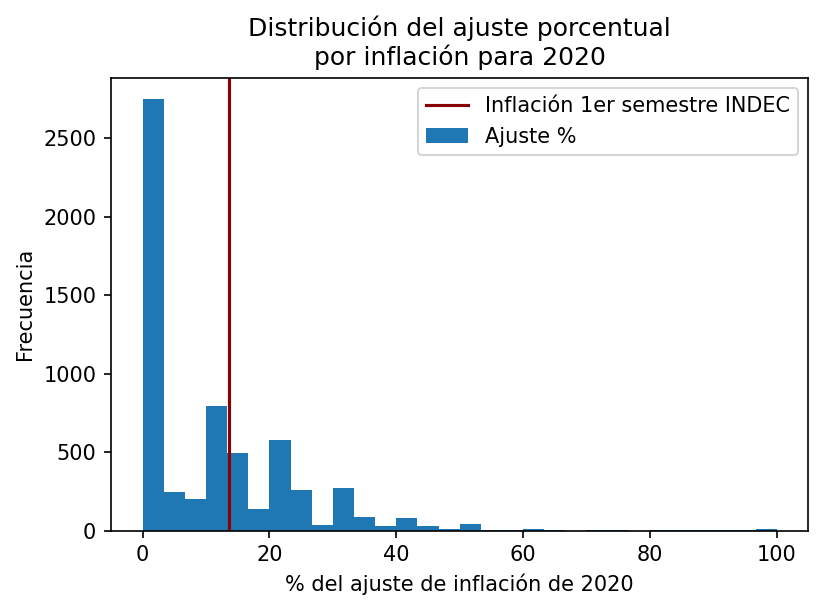

In [31]:
plt.figure(dpi=150)

plt.hist(df['¿De qué % fue el ajuste total?'], bins=30, label="Ajuste %")

plt.title("Distribución del ajuste porcentual\npor inflación para 2020")
plt.ylabel("Frecuencia")
plt.xlabel("% del ajuste de inflación de 2020")
plt.axvline(x=13.6, color="darkred", label="Inflación 1er semestre INDEC")
plt.legend()
plt.show()

# Seaborn

In [32]:
import seaborn as sns

In [33]:
sns.set()

[Seaborn](http://seaborn.pydata.org) tambien usa matplotlib al igual que pandas, por lo que todas las funciones de matplotlib tambien le sirven

## Distribution plots

### Countplot

El countplot es la forma que tiene seaborn de hacer gráficos de barras, permitiendo dividirlo de distintas formas.

/opt/hostedtoolcache/Python/3.7.9/x64/lib/python3.7/site-packages/matplotlib/backends/backend_agg.py:238: RuntimeWarning: Glyph 129335 missing from current font.
  font.set_text(s, 0.0, flags=flags)
/opt/hostedtoolcache/Python/3.7.9/x64/lib/python3.7/site-packages/matplotlib/backends/backend_agg.py:238: RuntimeWarning: Glyph 127995 missing from current font.
  font.set_text(s, 0.0, flags=flags)


/opt/hostedtoolcache/Python/3.7.9/x64/lib/python3.7/site-packages/matplotlib/backends/backend_agg.py:201: RuntimeWarning: Glyph 129335 missing from current font.
  font.set_text(s, 0, flags=flags)
/opt/hostedtoolcache/Python/3.7.9/x64/lib/python3.7/site-packages/matplotlib/backends/backend_agg.py:201: RuntimeWarning: Glyph 127995 missing from current font.
  font.set_text(s, 0, flags=flags)


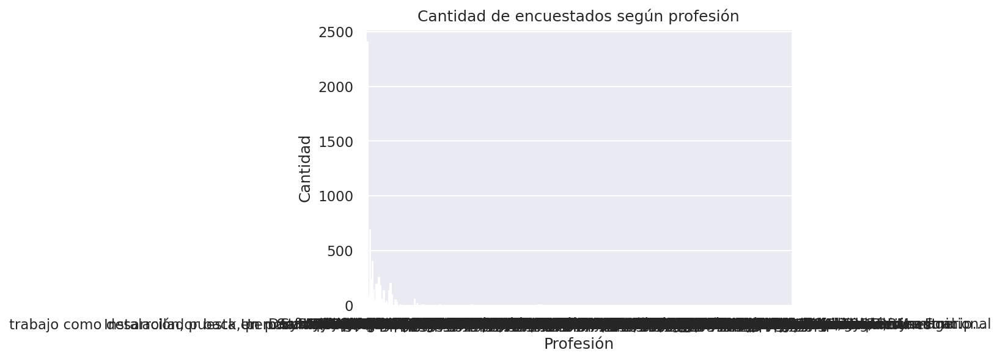

In [34]:
plt.figure(dpi=150)
sns.countplot(x="Trabajo de", data=df)
plt.ylabel("Cantidad")
plt.xlabel("Profesión")
plt.title("Cantidad de encuestados según profesión")
plt.show()

Podemos usar el parametro order para indicar el orden en el que lo queremos pero tambien cuales profesiones queremos

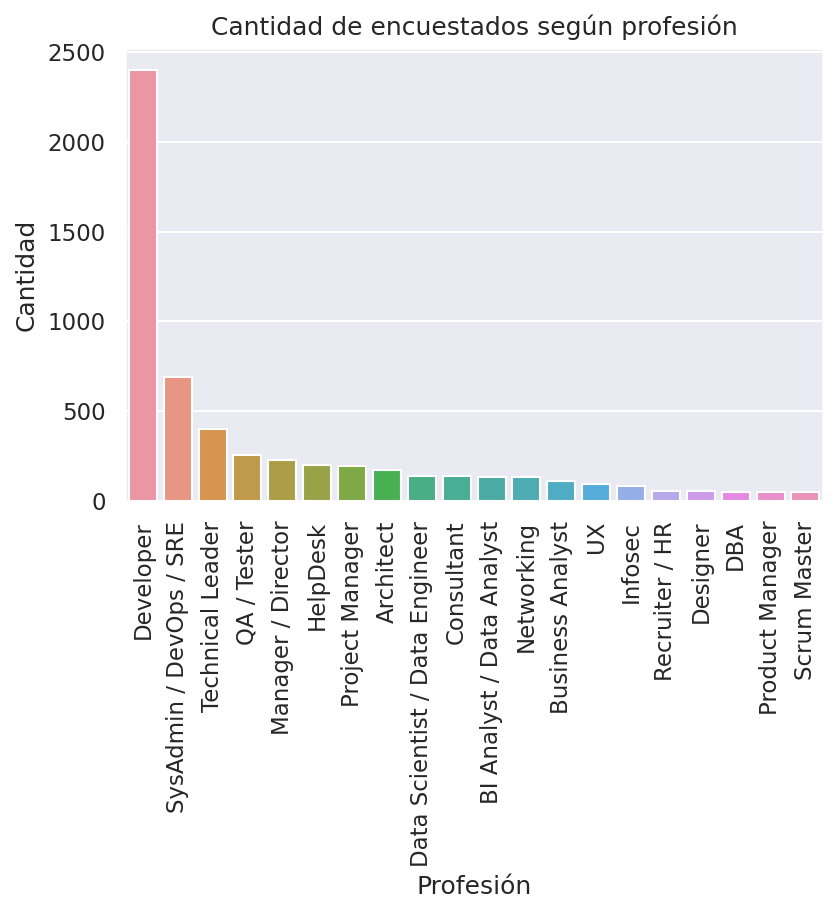

In [35]:
plt.figure(dpi=150)
sns.countplot(
    x="Trabajo de", data=df, order=df["Trabajo de"].value_counts().iloc[:20].index
)
plt.ylabel("Cantidad")
plt.xlabel("Profesión")
plt.title("Cantidad de encuestados según profesión")
plt.xticks(rotation=90)
plt.show()

### Density plot

Podemos ver la distribución del salario como habíamos visto con el histograma

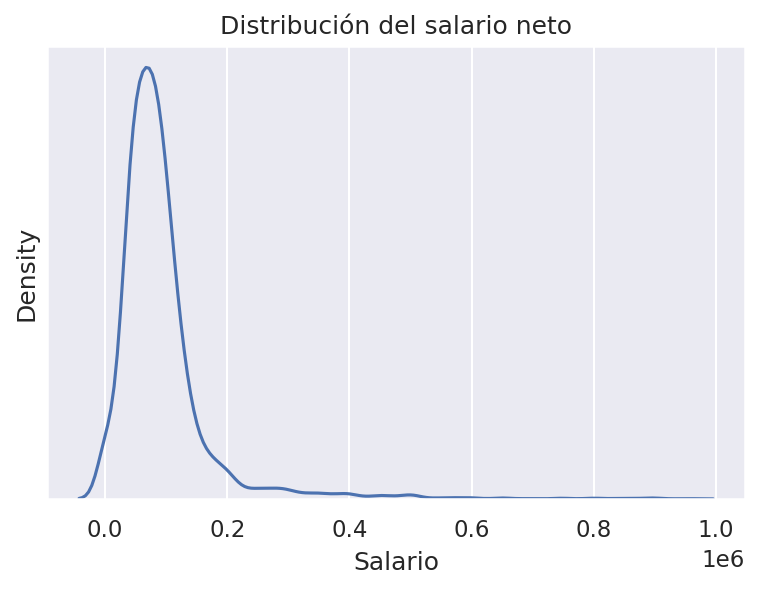

In [36]:
df_submm = df[
    (df['Salario mensual NETO (en tu moneda local)'] < 1e6)
    & (df['Salario mensual BRUTO (en tu moneda local)'] < 1e6)
]

plt.figure(dpi=150)

sns.kdeplot(
    df_submm['Salario mensual NETO (en tu moneda local)'], label="Salario mensual neto"
)
plt.title("Distribución del salario neto")
plt.xlabel("Salario")
plt.yticks([], [])

plt.show()

### Violinplot

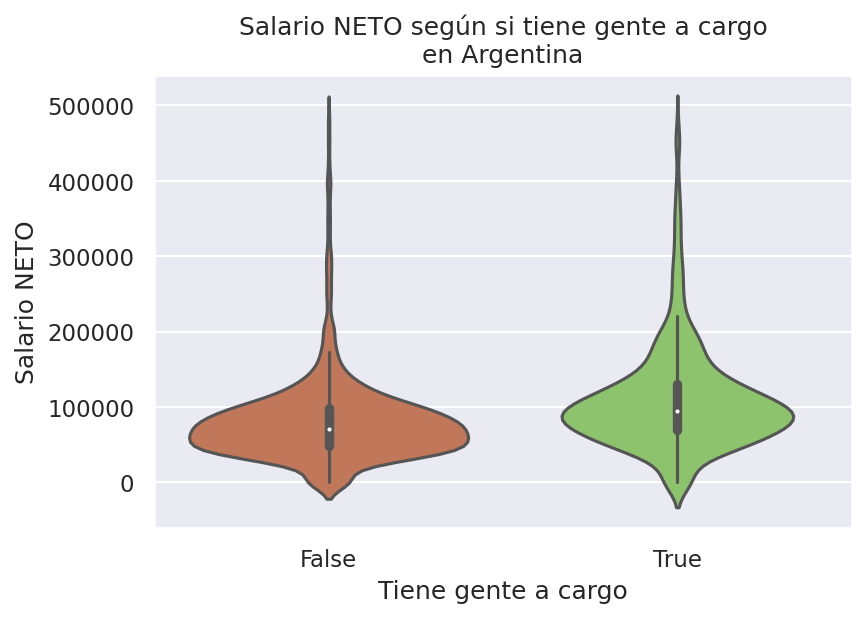

In [37]:
df['Tiene gente a cargo'] = df['¿Gente a cargo?'] > 0
plt.figure(dpi=150)
plt.title("Salario NETO según si tiene gente a cargo\nen Argentina")
sns.violinplot(
    data=df[
        (df["Estoy trabajando en"] == "Argentina")
        & (df['Salario mensual NETO (en tu moneda local)'] < 500000)
    ],
    y='Salario mensual NETO (en tu moneda local)',
    x='Tiene gente a cargo',
    palette=['#D17049', "#89D15E"],
)
plt.ylabel("Salario NETO")
plt.show()

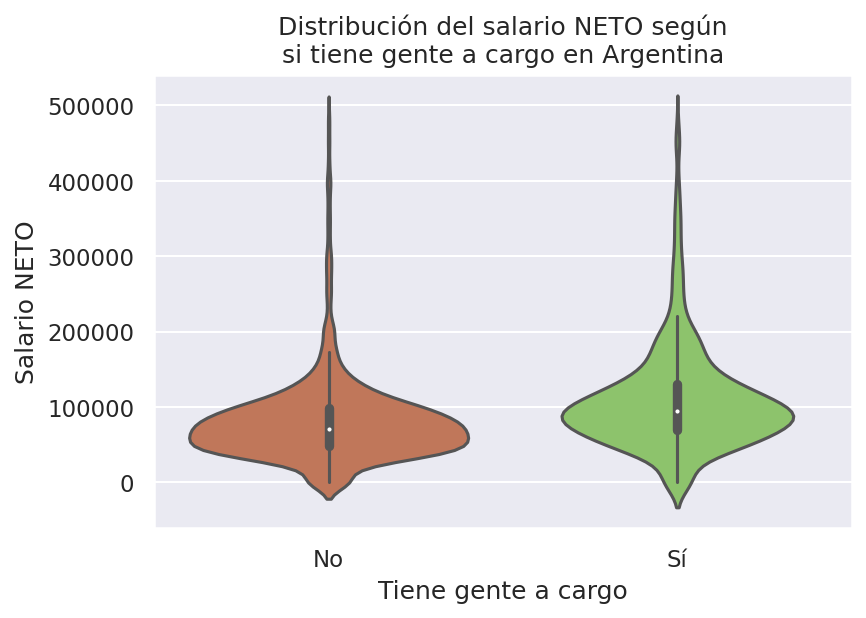

In [38]:
df['Tiene gente a cargo'] = df['¿Gente a cargo?'] > 0
plt.figure(dpi=150)
plt.title("Distribución del salario NETO según\nsi tiene gente a cargo en Argentina")
sns.violinplot(
    data=df[
        (df["Estoy trabajando en"] == "Argentina")
        & (df['Salario mensual NETO (en tu moneda local)'] < 500000)
    ],
    y='Salario mensual NETO (en tu moneda local)',
    x='Tiene gente a cargo',
    palette=['#D17049', "#89D15E"],
)
plt.ylabel("Salario NETO")
plt.xticks([False, True], ["No", "Sí"])
plt.show()

### Boxplot

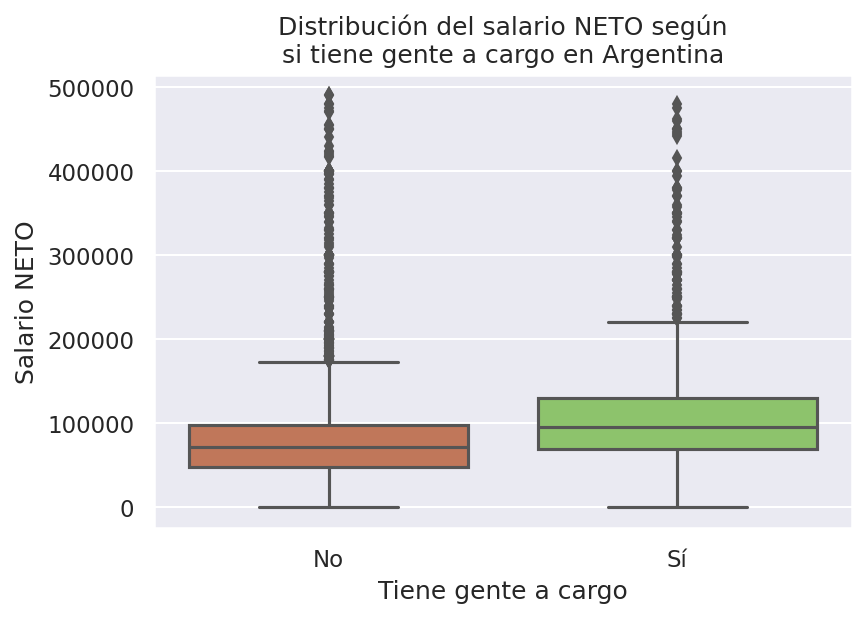

In [39]:
plt.figure(dpi=150)
plt.title("Distribución del salario NETO según\nsi tiene gente a cargo en Argentina")
sns.boxplot(
    data=df[
        (df["Estoy trabajando en"] == "Argentina")
        & (df['Salario mensual NETO (en tu moneda local)'] < 500000)
    ],
    y='Salario mensual NETO (en tu moneda local)',
    x='Tiene gente a cargo',
    palette=['#D17049', "#89D15E"],
)
plt.ylabel("Salario NETO")
plt.xticks([False, True], ["No", "Sí"])
plt.show()

## Comparison plots
### Scatter plot

Recordemos el último scatter que hicimos

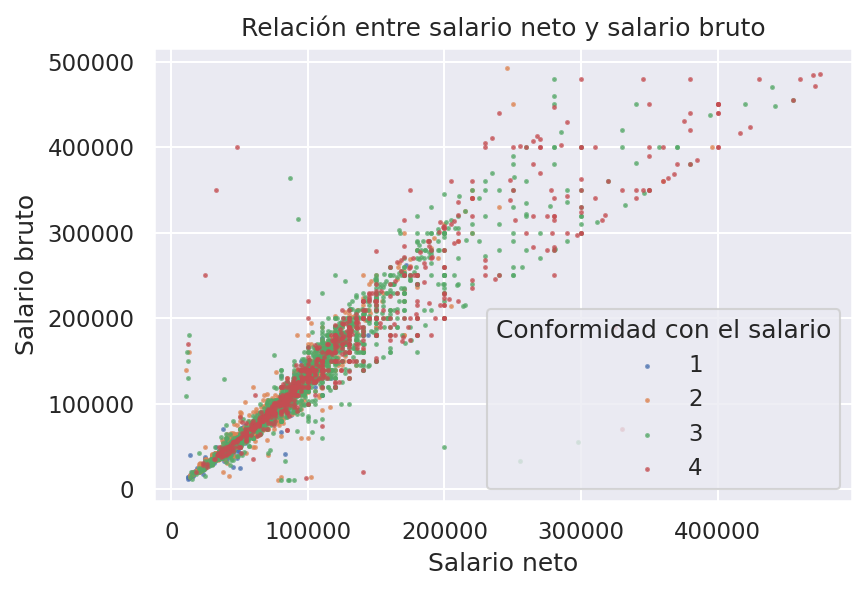

In [40]:
fig, ax = plt.subplots(dpi=150)

df_submm = df[
    (df['Salario mensual NETO (en tu moneda local)'] < 5e5)
    & (df['Salario mensual BRUTO (en tu moneda local)'] < 5e5)
    & (df['Salario mensual BRUTO (en tu moneda local)'] > 1e4)
    & (df['Salario mensual NETO (en tu moneda local)'] > 1e4)
]

for conformity in np.sort(df_submm['¿Qué tan conforme estás con tu sueldo?'].unique()):
    conformity_df = df_submm[
        df_submm['¿Qué tan conforme estás con tu sueldo?'] == conformity
    ]
    ax.scatter(
        x=conformity_df['Salario mensual NETO (en tu moneda local)'],
        y=conformity_df['Salario mensual BRUTO (en tu moneda local)'],
        s=2,
        label=conformity,
        alpha=0.65,
    )

ax.legend(title="Conformidad con el salario")
plt.ylabel("Salario bruto")
plt.xlabel("Salario neto")
plt.title('Relación entre salario neto y salario bruto')
plt.show()

Al haber ploteado en orden los distintos puntos se superponen de forma que no nos permite ver diferencias. Con el hue de seaborn podemos hacer que la superposición sea random.

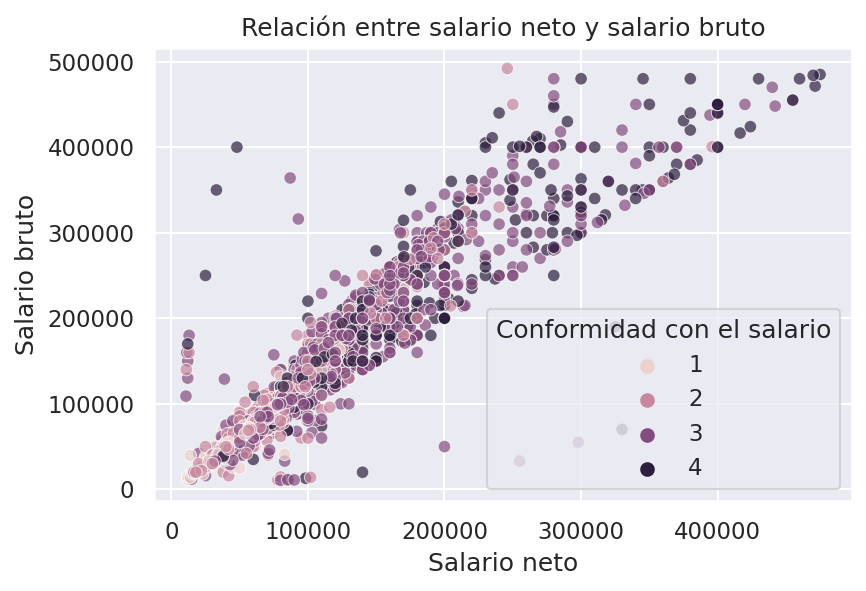

In [41]:
df_submm = df[
    (df['Salario mensual NETO (en tu moneda local)'] < 5e5)
    & (df['Salario mensual BRUTO (en tu moneda local)'] < 5e5)
    & (df['Salario mensual BRUTO (en tu moneda local)'] > 1e4)
    & (df['Salario mensual NETO (en tu moneda local)'] > 1e4)
]

plt.figure(dpi=150)
sns.scatterplot(
    x='Salario mensual NETO (en tu moneda local)',
    y='Salario mensual BRUTO (en tu moneda local)',
    hue=df_submm['¿Qué tan conforme estás con tu sueldo?'].tolist(),
    data=df_submm,
    alpha=0.7,
)
plt.legend(title="Conformidad con el salario")
plt.ylabel("Salario bruto")
plt.xlabel("Salario neto")
plt.title('Relación entre salario neto y salario bruto')
plt.show()

Ahora se puede aprecias el gradiente de colores a medida el salario aumenta

### Heatmap

In [42]:
cooccurrence = pd.pivot_table(
    df,
    '¿Gente a cargo?',
    'Cómo creés que está tu sueldo con respecto al último semestre',
    '¿Qué tan conforme estás con tu sueldo?',
    'count',
).sort_index()
cooccurrence

¿Qué tan conforme estás con tu sueldo?,1,2,3,4
Cómo creés que está tu sueldo con respecto al último semestre,,,,
1,521,564,128,4
2,123,1108,980,37
3,5,208,1347,267
4,1,17,215,570


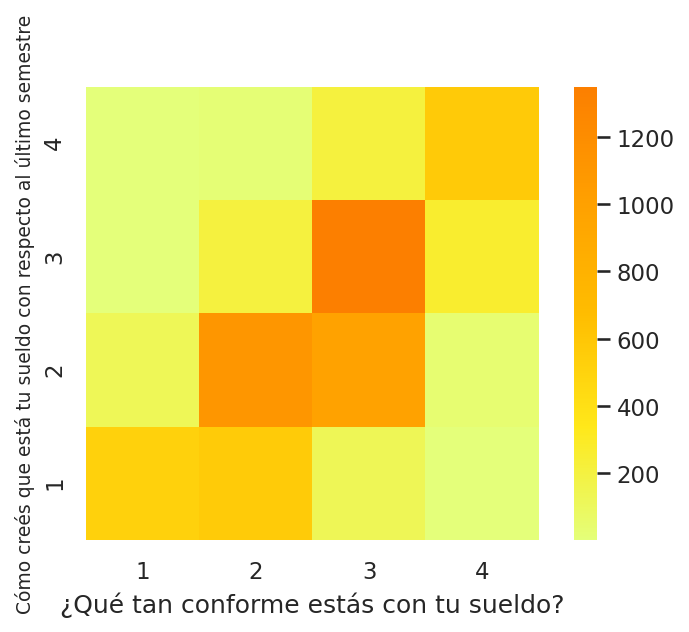

In [43]:
plt.figure(dpi=150)
plt.ylabel("Cómo creés que está tu sueldo con respecto al último semestre", fontsize=9)
sns.heatmap(cooccurrence.reindex([4, 3, 2, 1]), square=True, cmap="Wistia")
plt.show()

## Regression plots
### Regplot

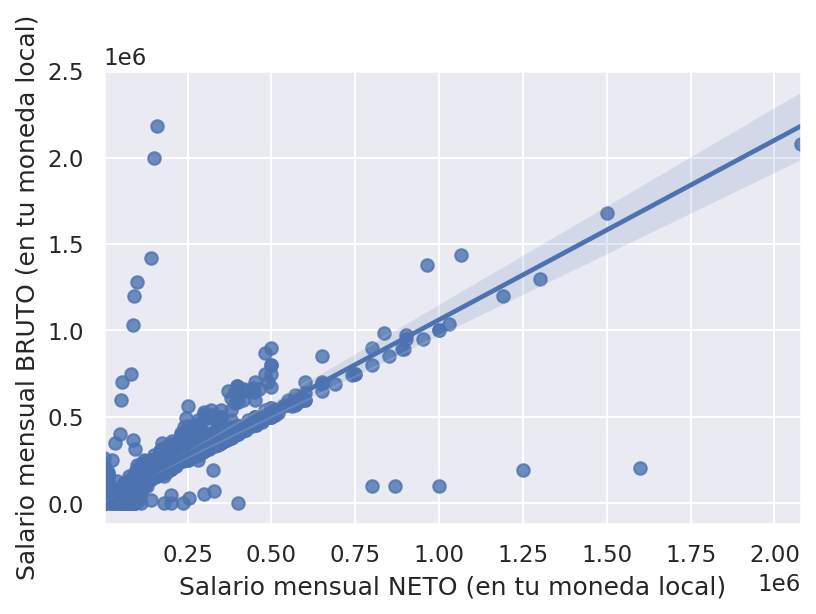

In [44]:
plt.figure(dpi=150)
sns.regplot(
    data=df,
    x='Salario mensual NETO (en tu moneda local)',
    y='Salario mensual BRUTO (en tu moneda local)',
)
plt.show()

## Relational plots
### Lineplot

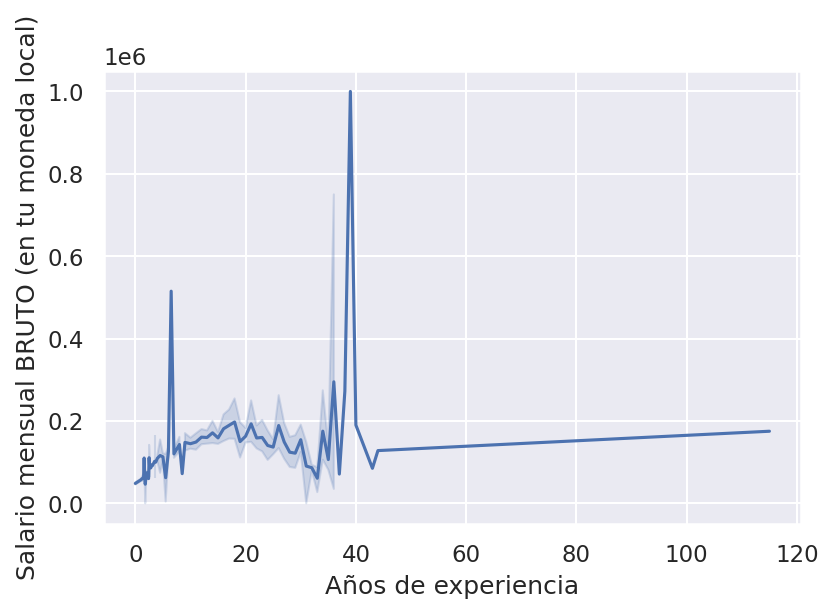

In [45]:
plt.figure(dpi=150)
sns.lineplot(
    data=df, x='Años de experiencia', y='Salario mensual BRUTO (en tu moneda local)'
)
plt.show()

# Paletas de colores

La elección de colores no es una decisión menor. Permite el mapeo de números a una representación visual y distinción entre grupos distintos. Hay mucha literatura sobre los criterios que debe cumplir una paleta de colores, algunos criterios relevantes son:
- que no sean sensitivas a deficiencias visuales
- el ordenamiento de los colores debe ser el mismo para todas las personas intuitivamente
- la interpolación percibida debe corresponderse con el mapa escalar subyacente

## Taxonomía de paletas

In [46]:
import matplotlib.pyplot as plt
import seaborn as sns

In [47]:
sns.set()

### Cualitativas
Se usan para representar colecciones de clases discretas sin orden. Los colores no tienen un ordenamiento, por lo tanto no s on apropiados para mapearse a un valor escalar.

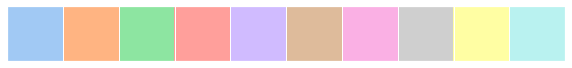

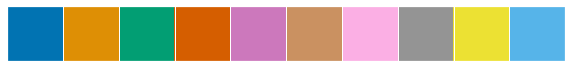

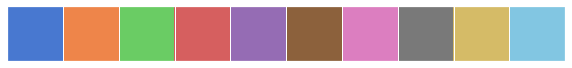

In [48]:
sns.palplot(sns.color_palette('pastel'))
plt.show()
sns.palplot(sns.color_palette('colorblind'))
plt.show()
sns.palplot(sns.color_palette('muted'))
plt.show()

### Secuenciales
Son casi monocromaticas, van de un color altamente saturado hacia distintos niveles de saturación más baja. Se suele aumentar la luminancia a medida que decrece la saturación, de modo que la paleta termina en colores cercanos al blanco. Se usa para representar información que tiene un ordenamiento.

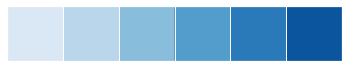

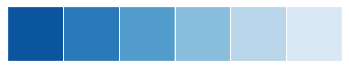

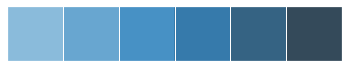

In [49]:
sns.palplot(sns.color_palette('Blues'))
plt.show()
sns.palplot(sns.color_palette('Blues_r'))
plt.show()
sns.palplot(sns.color_palette('Blues_d'))
plt.show()

#### Cubehelix
Es un sistema de paletas de colores que tienen un crecimiento/decrecimiento lineal en brillo y alguna variacion de tono. Lo cual implica que **se preserva la información al convertirse a blanco y negro**. Es ideal para **imprimir**.

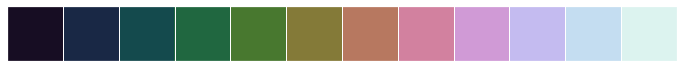

In [50]:
sns.palplot(sns.color_palette("cubehelix", 12))
plt.show()

### Divergentes
Tienen dos componentes principales de color, transicionando entre ambos pasando por un color poco saturado (blanco, amarillo). Se suelen usar para representar vvalores esacalares con un valor significativo cerca de la mediana.

Es importante tratar de no usar rojo y verde.

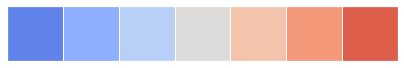

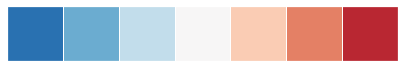

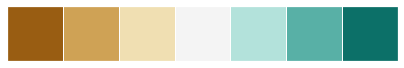

In [51]:
sns.palplot(sns.color_palette('coolwarm', 7))
plt.show()
sns.palplot(sns.color_palette('RdBu_r', 7))
plt.show()
sns.palplot(sns.color_palette('BrBG', 7))
plt.show()

### Cíclicas
Tienen dos componentes principales de color, que se encuentran en el medio y extremos en un color poco saturado. Se usan para valores que ciclan.

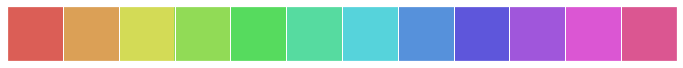

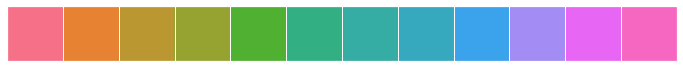

In [52]:
sns.palplot(sns.color_palette("hls", 12))
plt.show()

# brillo percibido mas uniformemente
sns.palplot(sns.color_palette("husl", 12))
plt.show()

## Algunos casos prácticos

Podemos indicar que color queremos con una tupla RGB donde cada elemento de la tupla es un número de 0 a 1 que indica la intensidad de alguno de los 3 colores primarios de la luz (__Rojo__, __Verde__, __Azul__) o lo que es lo mismo su codigo **hexadecimal**

In [53]:
from __future__ import print_function
from ipywidgets import interact, interactive, fixed, interact_manual
import ipywidgets as widgets


def rgb_to_hex(rgb):
    return '%02x%02x%02x' % rgb


def plot_color(r, g, b):
    print(
        "Hexadecimal: %s" % rgb_to_hex((round(r * 255), round(g * 255), round(b * 255)))
    )
    sns.palplot([(r, 0, 0), (0, g, 0), (0, 0, b), (r, g, b)])
    plt.xticks([0, 1, 2, 3], ["Rojo", "Azul", "Verde", "(r,g,b)"])
    plt.grid(False)
    plt.show()

In [54]:
interact(
    plot_color, r=(0.0, 1.0, 1 / 255), g=(0.0, 1.0, 1 / 255), b=(0.0, 1.0, 1 / 255)
)

interactive(children=(FloatSlider(value=0.4980392156862745, description='r', max=1.0, step=0.00392156862745098…

<function __main__.plot_color(r, g, b)>

Pueden jugar con más en: https://color.adobe.com/

Recordando el pie plot podriamos elegir colores más adecuados en donde comunicamos tener gente a cargo como algo más "positivo"

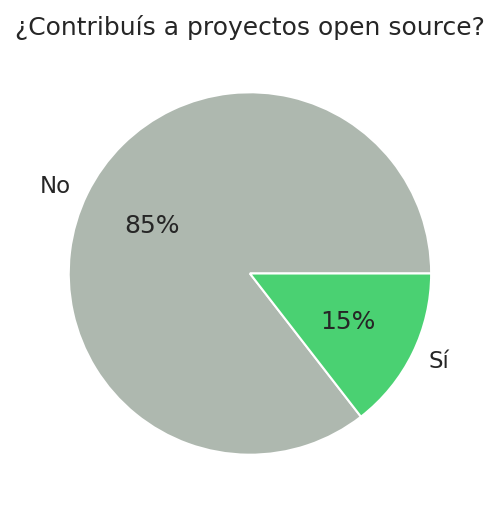

In [55]:
plt.figure(dpi=150)
df['¿Contribuís a proyectos open source?'].value_counts()[
    ["Sí", "No"]
].sort_index().plot(kind='pie', autopct='%1.0f%%', colors=['#AEB8AF', "#4AD172"])
plt.title('¿Contribuís a proyectos open source?')
plt.ylabel("")
plt.show()

Recordemos el countplot que hicimos

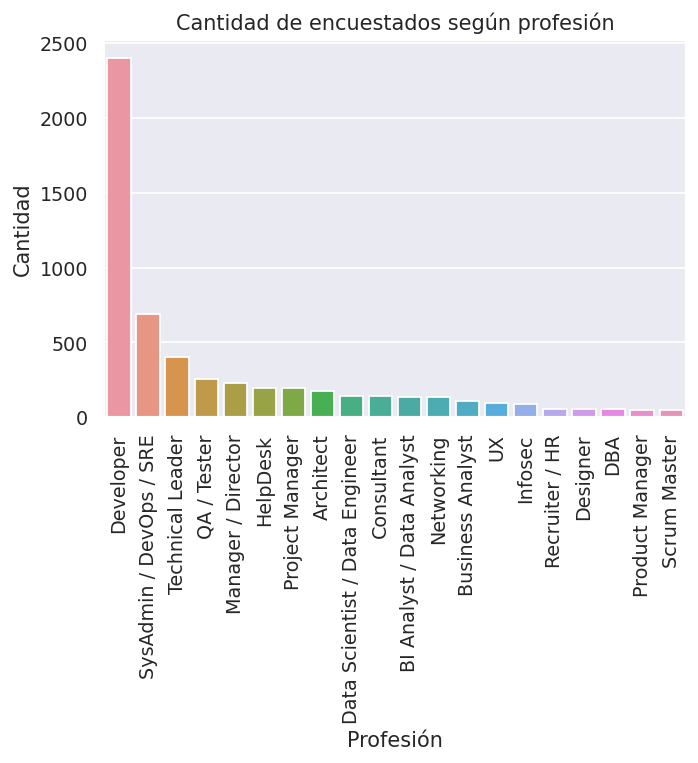

In [56]:
plt.figure(dpi=125)
sns.countplot(
    x="Trabajo de", data=df, order=df["Trabajo de"].value_counts().iloc[:20].index
)
plt.ylabel("Cantidad")
plt.xlabel("Profesión")
plt.title("Cantidad de encuestados según profesión")
plt.xticks(rotation=90)
plt.show()

Podemos pensar el color como una dimensión más, que sentido tienen en esta visualización los colores? Está scrum master relacionado con developer por tener colores parecidos?

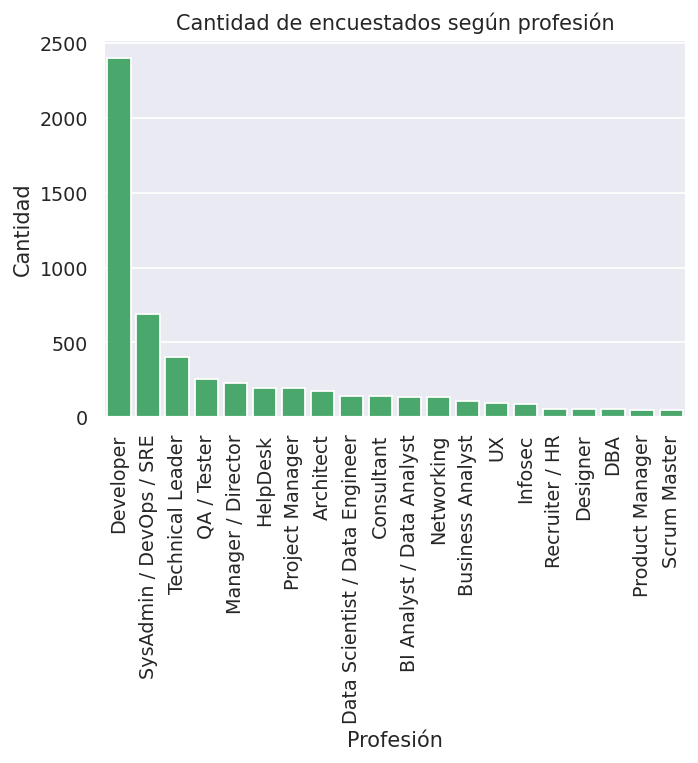

In [57]:
plt.figure(dpi=125)
sns.countplot(
    x="Trabajo de",
    data=df,
    order=df["Trabajo de"].value_counts().iloc[:20].index,
    color=(0.23, 0.72, 0.41),
)
plt.ylabel("Cantidad")
plt.xlabel("Profesión")
plt.title("Cantidad de encuestados según profesión")
plt.xticks(rotation=90)
plt.show()

Teníamos el siguiente scatter plot

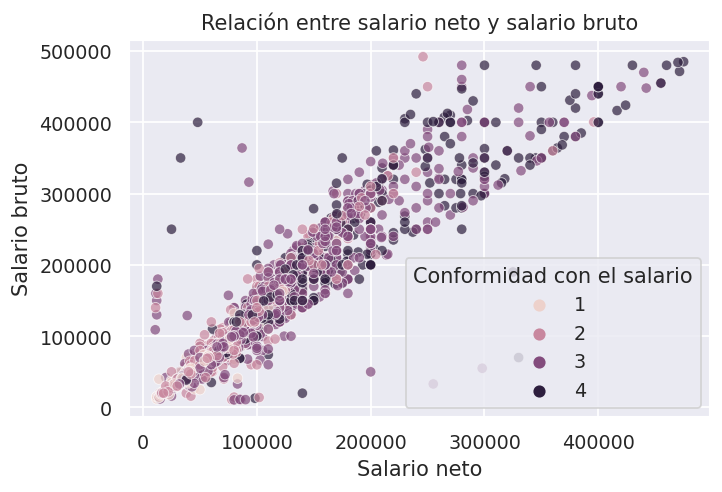

In [58]:
df_submm = df[
    (df['Salario mensual NETO (en tu moneda local)'] < 5e5)
    & (df['Salario mensual BRUTO (en tu moneda local)'] < 5e5)
    & (df['Salario mensual BRUTO (en tu moneda local)'] > 1e4)
    & (df['Salario mensual NETO (en tu moneda local)'] > 1e4)
]

plt.figure(dpi=125)
sns.scatterplot(
    x='Salario mensual NETO (en tu moneda local)',
    y='Salario mensual BRUTO (en tu moneda local)',
    hue=df_submm['¿Qué tan conforme estás con tu sueldo?'].tolist(),
    data=df_submm,
    alpha=0.7,
)
plt.legend(title="Conformidad con el salario")
plt.ylabel("Salario bruto")
plt.xlabel("Salario neto")
plt.title('Relación entre salario neto y salario bruto')
plt.show()

Podemos cambiar los colores para dar a entender que una conformidad de 1 es "mala" y una conformidad de 4 es "buena"

In [59]:
sns.color_palette("RdYlGn_r", 4)

[(0.4000000000000002, 0.7411764705882354, 0.38823529411764707),
 (0.8509803921568628, 0.9372549019607844, 0.5450980392156864),
 (0.996078431372549, 0.8784313725490196, 0.5450980392156862),
 (0.9568627450980393, 0.42745098039215684, 0.2627450980392157)]

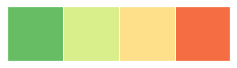

In [60]:
sns.palplot(sns.color_palette("RdYlGn_r", 4))

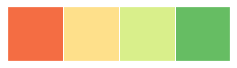

In [61]:
sns.palplot(list(reversed(sns.color_palette("RdYlGn_r", 4))))

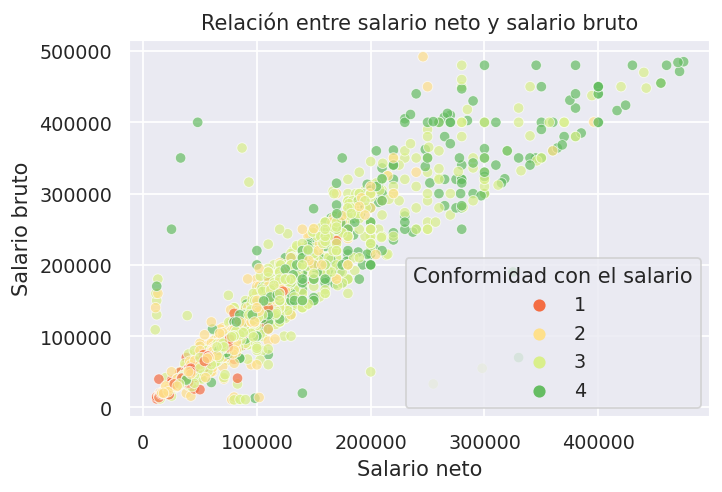

In [62]:
df_submm = df[
    (df['Salario mensual NETO (en tu moneda local)'] < 5e5)
    & (df['Salario mensual BRUTO (en tu moneda local)'] < 5e5)
    & (df['Salario mensual BRUTO (en tu moneda local)'] > 1e4)
    & (df['Salario mensual NETO (en tu moneda local)'] > 1e4)
]

plt.figure(dpi=125)
sns.scatterplot(
    x='Salario mensual NETO (en tu moneda local)',
    y='Salario mensual BRUTO (en tu moneda local)',
    hue=df_submm['¿Qué tan conforme estás con tu sueldo?'].tolist(),
    data=df_submm,
    alpha=0.7,
    palette=list(reversed(sns.color_palette("RdYlGn_r", 4))),
)
plt.legend(title="Conformidad con el salario")
plt.ylabel("Salario bruto")
plt.xlabel("Salario neto")
plt.title('Relación entre salario neto y salario bruto')
plt.show()

## Referencias

- [Documentación de seaborn](http://seaborn.pydata.org/tutorial/color_palettes.html)
- [Diverging Color Maps for Scientific Visualization - Kenneth Moreland](https://cfwebprod.sandia.gov/cfdocs/CompResearch/docs/ColorMapsExpanded.pdf)
- [XKCD color survey](https://blog.xkcd.com/2010/05/03/color-survey-results/)
- [Subtleties of colors series](https://earthobservatory.nasa.gov/blogs/elegantfigures/2013/08/05/subtleties-of-color-part-1-of-6/)
- [Documentación de matplotlib](https://matplotlib.org/tutorials/colors/colormaps.html)

# Pandas profiling

In [63]:
from pandas_profiling import ProfileReport

report = ProfileReport(
    df, title='Encuesta de sueldos sysarmy 2020.02', explorative=True, lazy=False
)

In [64]:
report.to_notebook_iframe()